In [1]:
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
outpath = "../data/curated/mastodon_processed.csv"

In [3]:
df = pd.read_csv(outpath, index_col=0, dtype={"t_score":float, "w_score":float}) 
df["hashtags"] = df["hashtags"].str.strip('][').str.split(', ')
df["token"] = df["token"].str.strip('][').str.split(', ')
df["hashtag_length"] = df["hashtags"].apply(len)
df["token_length"] = df["token"].apply(len)

In [4]:
cols = ["t_score","w_score","hashtag_length","token_length"]

In [5]:
df.dtypes

created_at         object
hashtags           object
language           object
token              object
t_score           float64
w_score           float64
hashtag_length      int64
token_length        int64
dtype: object

In [6]:
import plotly.graph_objects as go
df = df[cols]
x = cols
heat = go.Heatmap(z =df.corr(),
                  x = x,
                  y = x,
                  xgap=1, ygap=1,
                  colorbar_thickness=20,
                  colorbar_ticklen=3,
                  hovertext = df.corr(),
                  hoverinfo='text'
                   )

title = 'Correlation Matrix'               

layout = go.Layout(title_text=title, title_x=0.5, 
                   width=600, height=600,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed')
   
fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

In [8]:
import plotly.express as px
from sklearn.decomposition import PCA

features = cols

pca = PCA()
components = pca.fit_transform(df[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=df["w_score"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [10]:
import plotly.express as px
from sklearn.decomposition import PCA

X = df[cols]

pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=df["w_score"], # try "dwell_prct", "transit_prct", "needs_classified_prct", "noisy_dwell_prct", "poison_ping_prct", "bad_gps_prct"
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

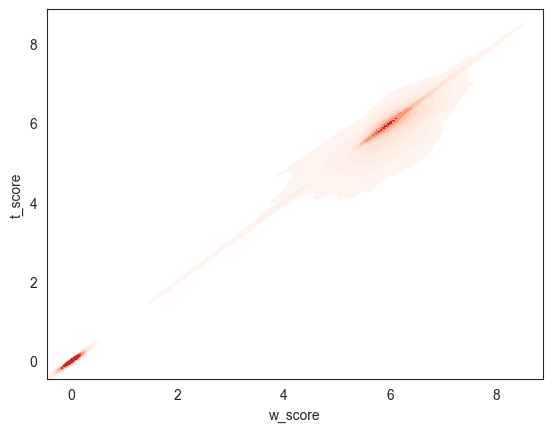

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

df = df[["w_score", "t_score"]]
 
# set seaborn style
sns.set_style("white")
 
# Custom the color, add shade and bandwidth
sns.kdeplot(x=df.w_score, y=df.t_score, cmap="Reds", fill=True, bw_adjust=.5)
plt.show()